# Generative AI Toolkit for SAP HANA Cloud - Demo

The __generative AI toolkit for SAP HANA Cloud__ is an extension of the existing __Python ML client for SAP HANA__, mainly focusing on GenAI and related use cases. It includes many leading-edge GenAI related open source libraries and provides seamless integration with HANA ML, HANA vector engine, and others libraries like  SAP GenAI Hub SDK.  
For further details see the [Introduction](https://github.com/SAP/generative-ai-toolkit-for-sap-hana-cloud/blob/main/INTRODUCTION.md) and [Documentation](https://sap.github.io/generative-ai-toolkit-for-sap-hana-cloud/).

Setup regarding __hana-ml__ and __hana-ai__  
You have installed the required Python packages pip install -U hana-ml.  
Download the hana-ai package from [github releases](https://github.com/SAP/generative-ai-toolkit-for-sap-hana-cloud/releases) and install it using pip install generative-ai-toolkit-for-sap-hana-cloud-x.x.x.zip. (pypi package will be available soon)

In [3]:
# The Demo is based on versions: hana_ml 2.24.25031802 and hana_ai 1.0.25031900 
import hana_ml
print("hana_ml version: ", hana_ml.__version__)

import hana_ai

hana_ml version:  2.24.25031802


Setup regarding the __SAP generative AI hub SDK__  
You have installed the required Python packages __pip install "generative-ai-hub-sdk[all]"__.  
You have created a __deployment for a generative AI model__ in the SAP BTP, for instructions see the SAP AI core documentation section [Create a Deployment for a Generative AI Model](https://help.sap.com/docs/sap-ai-core/sap-ai-core-service-guide/create-deployment-for-generative-ai-model-in-sap-ai-core).  
The __generative AI hub SDK__ reuses configuration settings from the AI-core-SDK, these include client ID, client secret, authentication URL, base URL, and resource group. You can set these values as environment variables or via a config file. For detailed instructions see this [SAP Learning unit on using Generative-AI-Hub-SDK](https://learning.sap.com/learning-journeys/solving-your-business-problems-using-prompts-and-llms-in-sap-s-generative-ai-hub/identifying-the-need-for-using-generative-ai-hub-sdk).

In [4]:
# Reasoning model configuration and consumption via SAP generative AI hub
from gen_ai_hub.proxy.langchain import init_llm
#llm = init_llm('gpt-4', temperature=0.0, max_tokens=600)
llm = init_llm('gpt-4o', temperature=0.0, max_tokens=2000)


Connecting to __SAP HANA Cloud__

In [5]:
import hana_ml.dataframe as dataframe
from hana_ml.dataframe import ConnectionContext
#cc = dataframe.ConnectionContext( address="<hana-cloud-hostname>", port=443,  user="<HANA-user>")
#cc = dataframe.ConnectionContext( userkey=<your-key-name>, sslValidateCertificate=False)

# Utilize connection credentials from external file
#from hana_ml.algorithms.pal.utility import Settings
#url, port, user, pwd = Settings.load_config("../../config/e2edata.ini", "api")
#cc = ConnectionContext(url, port, user, pwd)

# Utilize connection credentials from encrypten connection key
cc = ConnectionContext(userkey='<your key>')

# Control connection
print(cc.connection.isconnected())
print(cc.hana_version())

True
4.00.000.00.1740475414 (fa/CE2024.40)


# __Building a Forecast Model for SalesRefunds__ | Demo scenario and data

See Appendix import data section for loading the data.

In [31]:
# Using a HANA-ML HANA dataframe with a HANA Cloud database table
salesrefunds_hdf=cc.table("SALES_REFUNDS_TRAIN")

In [32]:
salesrefunds_hdf.sort("BOOKING_DATE", desc=False).tail(5).collect()

,BOOKING_DATE,REFUNDS
0,2024-09-24,8671.640
1,2024-09-25,4278.096
2,2024-09-26,4187.808
3,2024-09-27,1323.285
4,2024-09-28,7193.456


# Generative AI-agent assisted SAP HANA Cloud Forecast Model- and App-development

## Loading the SAP HANA Cloud ML tools for use by the AI-agent

For details on all available tools see the [documentation for hana_ml_tools](https://sap.github.io/generative-ai-toolkit-for-sap-hana-cloud/hana_ai.tools.html#hana-ml-tools).

In [33]:
# Instantiate a HANAMLToolkit and load all default tools
from hana_ai.tools.toolkit import HANAMLToolkit
hanaml_tools = HANAMLToolkit(cc, used_tools='all').get_tools()

In [34]:
# Show which tools are available
for tool in hanaml_tools:
    print(tool.name)

additive_model_forecast_fit_and_save
additive_model_forecast_load_model_and_predict
cap_artifacts
intermittent_forecast
ts_dataset_report
automatic_timeseries_fit_and_save
automatic_timeseries_load_model_and_predict
automatic_timeseries_load_model_and_score
ts_check
ts_outlier_detection
fetch_data
forecast_line_plot


## Initialize the generative AI-agent for HANA ML

This conversational AI-agent, aids to streamline development of SAP HANA Cloud forecasting and machine learning models, it's re-using the provided library of HANA ML-tools and is based on the Langchain-agent framework. For further details see the [documenatation](https://github.com/SAP/generative-ai-toolkit-for-sap-hana-cloud/blob/main/INTRODUCTION.md#agent-to-build-sap-hana-cloud-forecasting-and-machine-learning-models).

In [10]:
# Initiate a conversational, gernative AI-agent assisted HANA ML development session
from hana_ai.agents.hanaml_agent_with_memory import HANAMLAgentWithMemory 
hanaML_agent = HANAMLAgentWithMemory(llm=llm, tools=hanaml_tools, 
                                 session_id='hana-ai_salesrefunds_forecast', n_messages=30)

## Use the AI-agent to develop the SalesRefunds Forecast model

### Exploring the SalesRefunds data

Fetch the data.  
The tool __fetch_data-tool__ from the toolkit is used to fetch the data from the HANA database. The data is returned in the JSON format.

In [11]:
result = hanaML_agent.run("Show me the first 10 rows from SALES_REFUNDS table")
print(result)

{"fetched_data": "{\"BOOKING_DATE\":{\"0\":1714953600000,\"1\":1715040000000,\"2\":1715126400000,\"3\":1715212800000,\"4\":1715385600000,\"5\":1715472000000,\"6\":1716768000000,\"7\":1716854400000,\"8\":1716940800000,\"9\":1717027200000},\"REFUNDS\":{\"0\":67.29,\"1\":903.66,\"2\":2130.07,\"3\":4104.27,\"4\":7318.81,\"5\":0.0,\"6\":117.61,\"7\":7151.82,\"8\":7613.68,\"9\":7469.37}}"}


Create a __hana-ml dataset report__ for the given time series data using the tool `ts_dataset_report`

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:07<00:00,  1.06it/s]



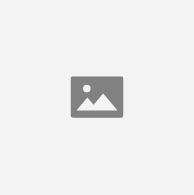

'{"html_file": "C:\\\\Users\\\\D059078\\\\AppData\\\\Local\\\\Temp\\\\hanaml_report\\\\SALES_REFUNDS_ts_report.html"}'

In [12]:
hanaML_agent.run("Please create a dataset report for this table")

### Analyse and check the time series data

Using the `ts_check`-tool to calculate the statistics of the time series data.

In [13]:
# Initiate the timeseries data analysis and checking-tool
print(hanaML_agent.run("Please analyze and check the time series data in the table SALES_REFUNDS_TRAIN"))

Intermittent Test: proportion of zero values is 0.14
Stationarity Test: The stationary is 1.The kpss_stat is 0.0457457.The p-value is 0.1.The lags is 13.The number of observations is 150.The critical values is {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}.
Trend Test: No trend.
Seasonality Test: The type is additive.The period is 28.The acf is 0.449686.


In [14]:
hanaML_agent.run("Which time series forecasting algorithm do you suggest based on the check result?")

'Based on the analysis of the time series data from the SALES_REFUNDS_TRAIN table, the data is stationary with no trend and has an additive seasonality with a period of 28. Given these characteristics, an Additive Model Forecasting algorithm would be suitable for this dataset. This model can effectively handle the additive seasonality and stationary nature of the data.'

### Now build the SalesRefund Forecast Model based on the suggested algorithm

Use suggested model to train the forecast model via the tool `xxx_fit_and_save`. 

In [15]:
hanaML_agent.run("Then please build a forecast model based on the suggested algorithm and save it as SalesRefundsForecastModel")

'{"trained_table": "SALES_REFUNDS_TRAIN", "model_storage_name": "SalesRefundsForecastModel", "model_storage_version": 4}'

### Apply the Forecast Model

Predict using the trained model using the `xxx_load_model_and_predict` tool.

In [16]:
hanaML_agent.run("Apply the forecast model SalesRefundsForecastModel to the SALES_REFUNDS_PREDICT table and generate the forecast")

'{"predicted_results_table": "SalesRefundsForecastModel_4_PREDICTED_RESULT"}'

Visualize the forcast predictions using the tool `forecast_line_plot`-tool.

In [40]:
hanaML_agent.run("Based on trained model SalesRefundsForecastModel and the forecast prediction results generate a forecast line plot. Note the confidence columns are YHAT_LOWER and YHAT_UPPER. And also display the actuals from the data used for training the model. " )

'{"html_file": "C:\\\\Users\\\\D059078\\\\AppData\\\\Local\\\\Temp\\\\hanaml_chart\\\\SalesRefundsForecastModel_3_PREDICTED_RESULT_forecast_line_plot.html"}'

### Generate design-time SQL artifacts for a SAP BTP CAP development project

Generate the CAP artifacts using the tool `cap_artifacts`.

In [17]:
hanaML_agent.run("Generate CAP artifacts, the project name is my_SalesRefunds_app and output path is ./tmp")

'CAP artifacts generated successfully. Root directory: ./tmp\\my_SalesRefunds_app'

# Appendix

## Data Import

Data set used derived from [product-sales-and-returns-dataset](https://www.kaggle.com/datasets/yaminh/product-sales-and-returns-dataset/data) dataset under license [Apache 2.0](https://www.apache.org/licenses/LICENSE-2.0)

In [27]:
import pandas as pd
import hana_ml.dataframe as dataframe
salesrefunds_hdf = dataframe.create_dataframe_from_pandas(cc ,
                                            pd.read_csv("SALES_REFUNDS.csv"),
                                            table_name="SALES_REFUNDS",
                                            force=True,
                                             table_structure={ "BOOKING_DATE" : "DATE", "REFUNDS": "DOUBLE"})

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 30.79it/s]


In [28]:
salesrefunds_hdf.dtypes()
#Should be: [('BOOKING_DATE', 'DATE', 10, 10, 10, 0), ('REFUNDS', 'DOUBLE', 15, 15, 15, 0)]

[('BOOKING_DATE', 'DATE', 10, 10, 10, 0), ('REFUNDS', 'DOUBLE', 15, 15, 15, 0)]

In [29]:
salesrefunds_hdf.sort("BOOKING_DATE", desc=False).head(150).save("SALES_REFUNDS_TRAIN", force=True)
salesrefunds_hdf.sort("BOOKING_DATE", desc=False).tail(30).save("SALES_REFUNDS_ACTUAL", force=True)
salesrefunds_hdf.sort("BOOKING_DATE", desc=False).tail(30).select(salesrefunds_hdf.columns[0]).save("SALES_REFUNDS_PREDICT", force=True)